In [1]:
# Imports
%load_ext autoreload
%autoreload 2


#os.environ["TF_CPP_MIN_LOG_LEVEL"]="0"
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # 0 1 7
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"]="false"
#os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]=".70"

import sys
import numpy as np

import matplotlib.pyplot as plt
import scipy.stats as stats

import pandas as pd
from sklearn.metrics import r2_score

# Add submodule to path
sys.path.append('../..')


from dml4fluxes.experiments import experiment, experiment_utils
from dml4fluxes.analysis.visualization import *
from dml4fluxes.datasets.preprocessing import *
from dml4fluxes.analysis.postprocessing import *

/home/kaicohrs/miniconda3/envs/dml/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
import pandas as pd
from dml4fluxes.analysis.postprocessing import load_partition, timely_averages
from dml4fluxes.experiments.utility import get_available_sites

import dml4fluxes.datasets.relevant_variables as relevant_variables
from dml4fluxes.datasets.preprocessing import unwrap_time, standardize_column_names

In [ ]:
site = 'FR-LBr'
year = 2006

In [ ]:
X = 8

if X == 1:
    X = ['VPD', 'TA', 'doy_sin','doy_cos']
    W = []
elif X == 2:
    X = ['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos']
    W = []
elif X == 3:
    X = ['VPD', 'TA', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 4:
    X = ['VPD', 'TA', 'SWC_1', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 5:
    X = ['VPD', 'TA', 'CWD', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 6:
    X = ['VPD', 'TA', 'CWD', 'doy_sin','doy_cos']
    W = []
elif X == 7:
    X = ['TA', 'VPD', 'SW_POT_sm', 'SW_POT_sm_diff'] #,,'doy_cos' 'GPP_prox' 'SWC_1'
    W = [] #'GPP_prox''NEE_nt_avg','SW_IN_POT', 'SW_POT_diff','GPP_prox''NEE_nt_avg'
elif X == 8:
    X = ['TA', 'SWC_1']
    W = [ 'doy_sin','doy_cos']
pre_computed=False
relnoise=0
site = site
year = year
dataset_config = dict(
        site_name = site,
        syn = False,
        version = 'simple',
        Q10=1.5,
        pre_computed=pre_computed,
        transform_T = True,
        month_wise= False,
        moving_window=[3, 5],
        delta = 'heuristic8',
        X = X, #'CWD'
        W = W,
        years = [year], # 'all',
        test_scenario=True,
        RMSE=True,
        alternative_fluxes=None,
        alternative_treatment=None, #"SW_IN_POT",
        good_years_only=True,
        store_parameter=True,
        )

In [ ]:
model_y_config = dict(model = 'GradientBoostingRegressor',
                    min_samples_split = 5,
                    min_samples_leaf = 40,
                    max_depth=1,
                    n_estimators=300,
                    n_iter_no_change=5,
                    validation_fraction=0.3,
        tol=0.01,
        )

model_t_config = dict(model = 'GradientBoostingRegressor',
                    min_samples_split = 5,
                    min_samples_leaf = 40,
                    max_depth=1,
                    n_estimators=300,
                    n_iter_no_change=5,
                    validation_fraction=0.3,
        tol=0.01,
                    )

model_final_config = dict(model = 'GradientBoostingRegressor',
                    min_samples_split = 5,
                    min_samples_leaf = 40,
                    max_depth=1,
                    n_estimators=300,
                    n_iter_no_change=10,
                    validation_fraction=0.3,                        
                    tol=0.0001,
        )

model_final_config = dict(model = 'DecisionTreeRegressor',
                #min_samples_split = 5,
                #min_samples_leaf = 40,
                max_depth=5,
                #n_estimators=300,
                #n_iter_no_change=10,
                #validation_fraction=0.3,                        
                #tol=0.0001,
)

In [8]:
trainer_config = {"weight_decay": 0.2, "iterations": 10000, "split": 1.0}
model_config = {"layers": [len(X)+len(W),16,16,16,1],
                        "final_nonlin": False,
                        "dropout_p": 0,
                        "ensemble_size": 1}
model_y_config = dict(model = 'EnsembleCustomJNN',
                    model_config = model_config,
                    trainer_config = trainer_config)
model_t_config = dict(model = 'EnsembleCustomJNN',
                    model_config = model_config,
                    trainer_config = trainer_config)

final_trainer_config = {"weight_decay": 0.0, "iterations": 20000, "split": 1.0}
model_config_final = {"layers": [len(X),32,32,32,1],
                        "final_nonlin": True,
                        "dropout_p": 0,
                        "ensemble_size": 1}
model_final_config = dict(model = 'EnsembleCustomJNN',
                    model_config = model_config_final,
                    trainer_config = final_trainer_config)

In [151]:
dml_config = dict(cv=10)

model_configs = dict(y = model_y_config,
                    t = model_t_config,
                    final= model_final_config,
                    dml =dml_config)

experiment_config = dict(experiment_type = 'flux_partitioning',
                        comment='Flux partitioning',
                        extrapolate=False,
                        seed=1000)


In [152]:
exp = experiment.FluxPartDML()
exp.new(site)
exp.configs(experiment_config, dataset_config, model_configs)
exp.prepare_data()
exp.fit_models()


Create new experiment folder : /home/kaicohrs/Repositories/dml-4-fluxes/scripts/notebooks/../../results/FPDML_FR-LBr_2023-11-16_9



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2006



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [125]:
import sklearn

In [131]:
exp.dml.est._ortho_learner_model_final._model_final._model.model_instance.plot_tree
#['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos']

AttributeError: 'DecisionTreeRegressor' object has no attribute 'plot_tree'

[Text(0.5, 0.9166666666666666, 'VPD <= 16.796\nsquared_error = 1.165\nsamples = 8129\nvalue = 0.906'),
 Text(0.25, 0.75, 'TA <= 14.325\nsquared_error = 1.02\nsamples = 5628\nvalue = 0.635'),
 Text(0.125, 0.5833333333333334, 'VPD <= 8.272\nsquared_error = 1.149\nsamples = 2246\nvalue = 0.326'),
 Text(0.0625, 0.4166666666666667, 'VPD <= 1.171\nsquared_error = 1.139\nsamples = 1621\nvalue = 0.21'),
 Text(0.03125, 0.25, 'TA <= 9.917\nsquared_error = 1.346\nsamples = 436\nvalue = -0.014'),
 Text(0.015625, 0.08333333333333333, 'squared_error = 1.121\nsamples = 390\nvalue = 0.061'),
 Text(0.046875, 0.08333333333333333, 'squared_error = 2.793\nsamples = 46\nvalue = -0.652'),
 Text(0.09375, 0.25, 'VPD <= 8.268\nsquared_error = 1.037\nsamples = 1185\nvalue = 0.293'),
 Text(0.078125, 0.08333333333333333, 'squared_error = 1.029\nsamples = 1184\nvalue = 0.296'),
 Text(0.109375, 0.08333333333333333, 'squared_error = 0.0\nsamples = 1\nvalue = -2.94'),
 Text(0.1875, 0.4166666666666667, 'VPD <= 10.887\

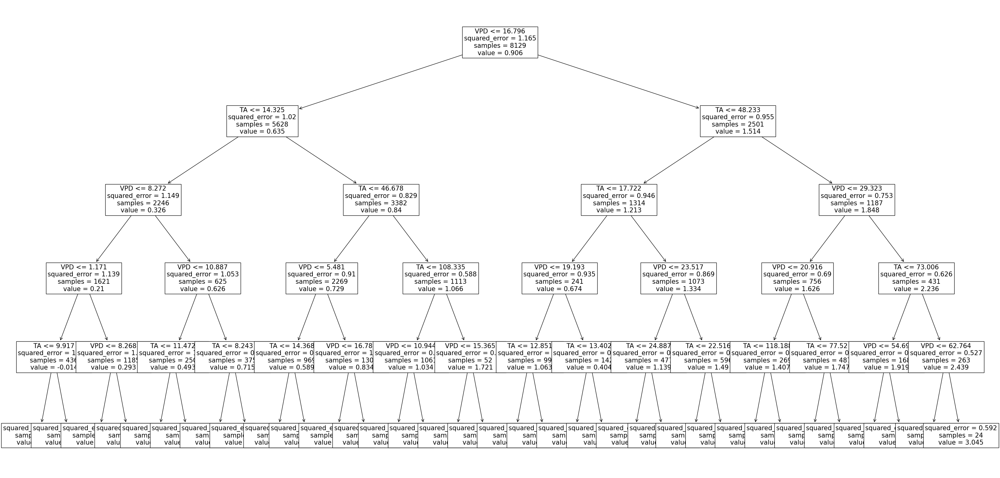

In [154]:
fig, ax = plt.subplots(1,1, figsize=(40,20))
sklearn.tree.plot_tree(exp.dml.est._ortho_learner_model_final._model_final._model.model_instance, feature_names=['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos'], max_depth=5,ax=ax, fontsize=15)
#['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos']

In [112]:
exp.dml.est._ortho_learner_model_final._model_final._model.model_instance.__dict__
#['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos']

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'n_features_in_': 5,
 'coef_': array([-0.05382425,  0.07348279,  0.00605131,  0.04429766,  0.18047103]),
 'rank_': 5,
 'singular_': array([2983.20299523, 1091.30203288,  285.89836581,   61.39701085,
          22.08555802]),
 'intercept_': 0.09077553007857475}

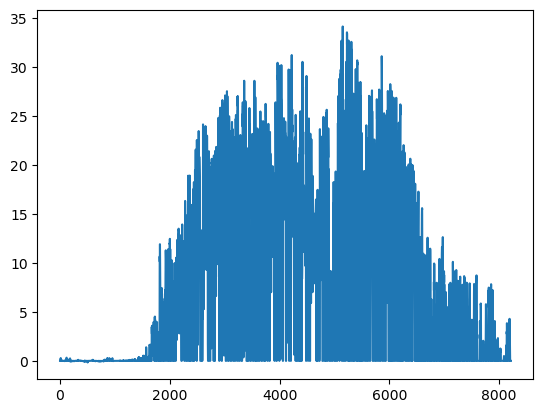

In [ ]:
import matplotlib.pyplot as plt
plt.plot(exp.dml.gpp(exp.X.values, exp.T.valubes))

data = load_partition('FPDML_US-SRG_2023-10-21_10', site_name='DE-Tha', year=2015, syn=False)

In [19]:
data = load_partition('FPDML_US-SRG_2023-10-21_20', site_name='US-SRG', year=2015, syn=False)

Filter out according to relevant_variables.


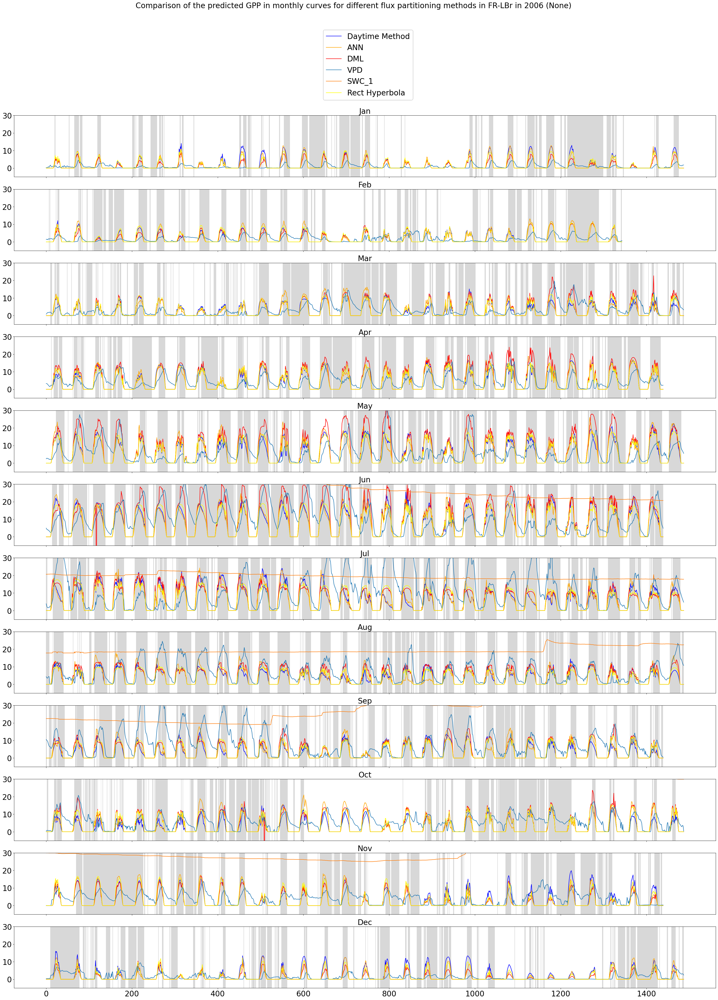

In [157]:
monthly_curves(site='FR-LBr', data=exp.data, year=2006, flux="GPP", res=False, input=['VPD', 'SWC_1', 'T'])

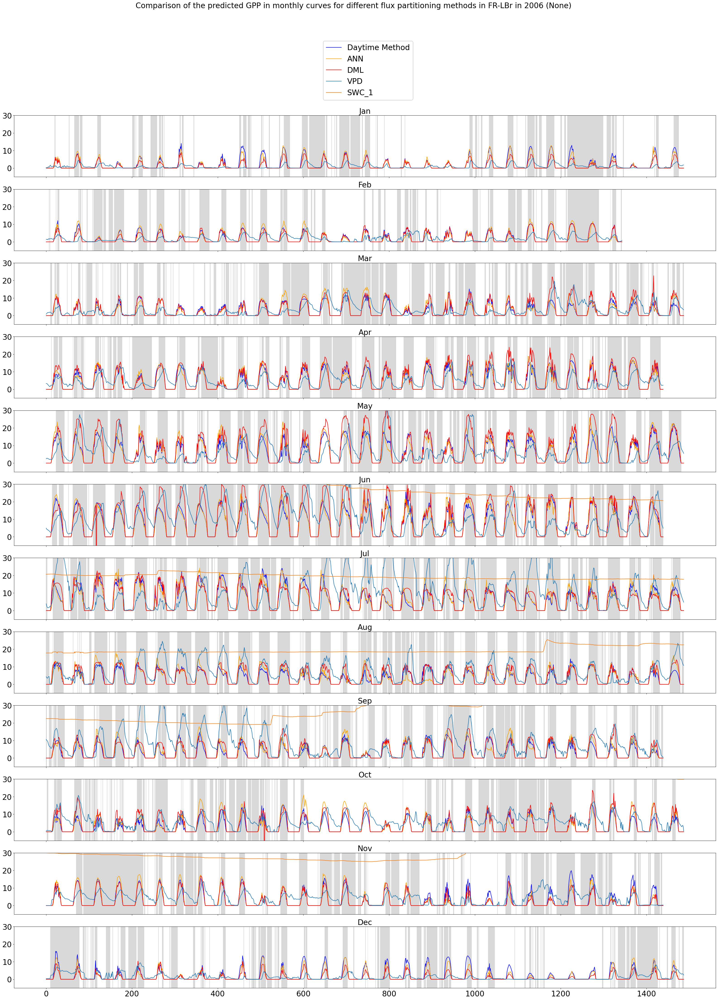

In [156]:
monthly_curves(site='FR-LBr', data=exp.data, year=2006, flux="GPP", res=False, input=['VPD', 'SWC_1', 'T'])

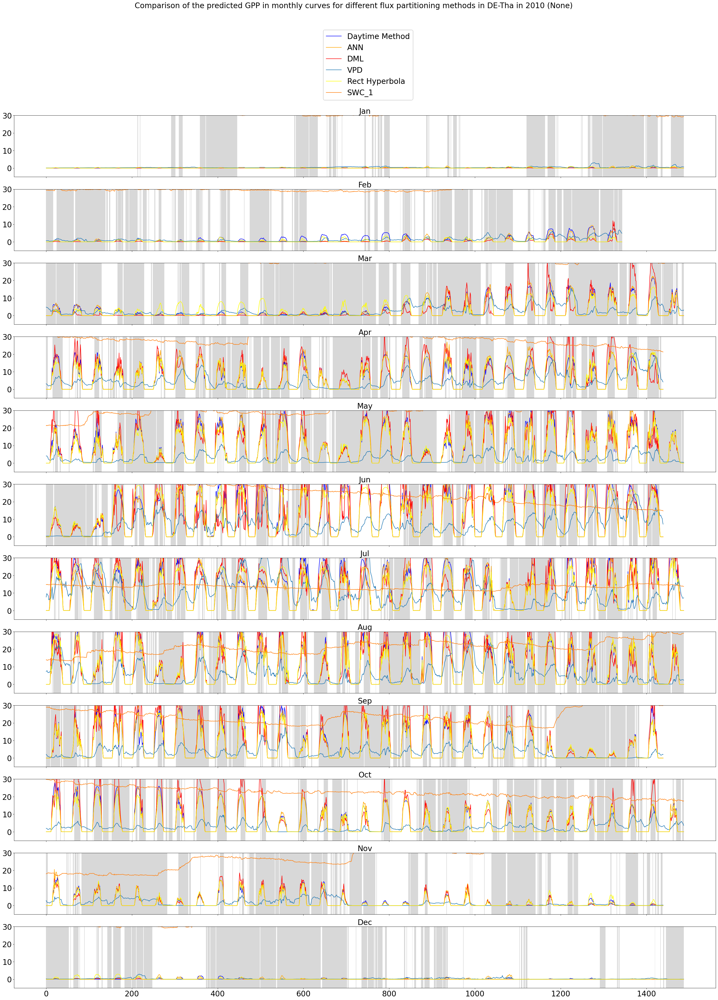

In [21]:
monthly_curves(site='DE-Tha', data=exp.data, year=2010, flux="GPP", res=False, input=['VPD','T', 'SWC_1'])

In [28]:
exp.dml.get_score(exp.X.values, exp.T.values, exp.Y.values, exp.W)

# Fit estimators on the rest


In [182]:
sys.path.append('../../bayes-q10')
from src.models.models import EnsembleCustomJNN

In [183]:
X = 7

if X == 1:
    X = ['VPD', 'TA', 'doy_sin','doy_cos']
    W = []
elif X == 2:
    X = ['VPD', 'TA', 'SWC_1', 'doy_sin','doy_cos']
    W = []
elif X == 3:
    X = ['VPD', 'TA', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 4:
    X = ['VPD', 'TA', 'SWC_1', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 5:
    X = ['VPD', 'TA', 'CWD', 'SW_ratio', 'doy_sin','doy_cos']
    W = []
elif X == 6:
    X = ['VPD', 'TA', 'CWD', 'doy_sin','doy_cos']
    W = []
elif X == 7:
    X = ['TA', 'VPD', 'SW_POT_sm', 'SW_POT_sm_diff', 'GPP_prox','NEE_nt_avg','SW_IN_POT', 'SW_POT_diff','SWC_1', 'SW_IN'] #,,'doy_cos' 
    W = [] #
pre_computed=False
relnoise=0
site = site
year = year
dataset_config = dict(
        site_name = site,
        syn = False,
        version = 'simple',
        Q10=1.5,
        pre_computed=pre_computed,
        transform_T = True,
        month_wise= False,
        moving_window=[3, 5],
        delta = 'heuristic8',
        X = X, #'CWD'
        W = W,
        years = [year], # 'all',
        test_scenario=True,
        RMSE=True,
        alternative_fluxes=None,
        alternative_treatment=None, #"SW_IN_POT",
        good_years_only=True,
        store_parameter=True,
        )

In [184]:
exp2 = experiment.FluxPartDML()
exp2.new(site)
exp2.configs(experiment_config, dataset_config, model_configs)
exp2.prepare_data()


Create new experiment folder : /home/kaicohrs/Repositories/dml-4-fluxes/scripts/notebooks/../../results/FPDML_DE-Tha_2023-10-30_11



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [185]:
exp2.fit_models()

2006



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [186]:
exp.data['Year']

DateTime
1997-02-23 13:15:00    1997
1997-02-23 13:45:00    1997
1997-02-23 14:15:00    1997
1997-02-23 14:45:00    1997
1997-02-23 15:15:00    1997
                       ... 
2014-12-31 21:45:00    2014
2014-12-31 22:15:00    2014
2014-12-31 22:45:00    2014
2014-12-31 23:15:00    2014
2014-12-31 23:45:00    2014
Name: Year, Length: 312982, dtype: int64

In [187]:
mask = (exp.data['Year']==year) & (exp.data['NEE_QC']==0)
exp.data['RECO_orth_res'] = exp.data['NEE'] + exp.data['GPP_orth']
Reco_y = exp.data['RECO_orth_res'][mask].values
#Reco_y = exp.data['RECO_orth'][mask]

In [188]:
final_trainer_config = {"weight_decay": 0.3, "iterations": 20000, "split": 1.0}
model_config_final = {"layers": [len(X),32,32,32,1],
                        "final_nonlin": True,
                        "dropout_p": 0,
                        "ensemble_size": 1}
Reco = EnsembleCustomJNN( model_config = model_config_final,
                    trainer_config = final_trainer_config)


In [189]:
Reco.fit(exp2.X,Reco_y)

100%|██████████| 20000/20000 [00:36<00:00, 555.45it/s, Max loss=0.0075384164, Max test loss=0.0077792895, Best test loss=0.0076741613]


In [190]:
site

'DE-Tha'

In [191]:
indices = (exp2.data['Year']==year)
exp.data.loc[indices, 'RECO_orth'] = Reco.predict(exp2.data.loc[indices, exp2.X_var].values)
exp.data.loc[indices, 'NEE_orth'] = -exp.data.loc[indices, 'GPP_orth'] + exp.data.loc[indices, 'RECO_orth']

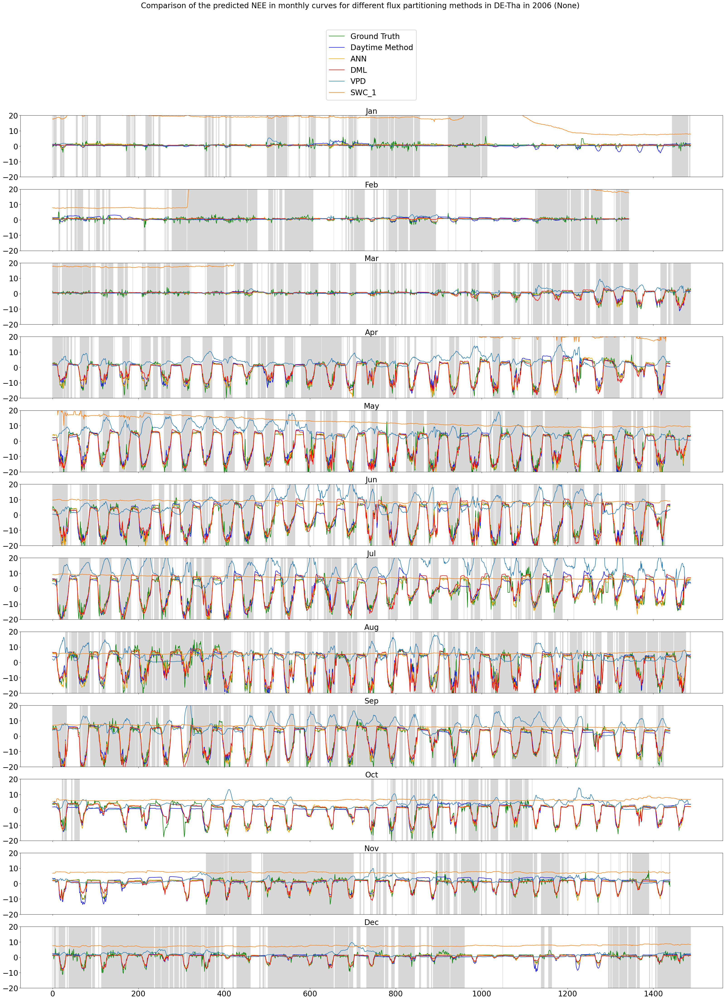

In [194]:
monthly_curves(site=site, data=exp.data, year=year, flux="NEE", res=False, input=['VPD', 'SWC_1'])

In [ ]:
exp.data['RECO_orth']

In [47]:
X = exp.data.loc[indices, exp.X_var].values
T = exp.data.loc[indices, 'T'].values

In [51]:
exp.dml.reco_res(Y, X, T).shape

In [70]:
exp.data['RECO_orth_res'] = None

In [73]:
monthly_curves(site='DE-Tha', data=exp.data, year=2010, flux="RECO", res=False, input=['VPD', 'SWC_1'])

Index(['SW_IN_POT', 'SWC_2_QC', 'SWC_1_QC', 'TS_2_QC', 'GPP_ann', 'NEE_QC',
       'RECO_ann', 'TS_2', 'SW_DIF', 'SWC_2', 'TS_1_QC', 'LW_IN_QC',
       'NEE_RANDUNC', 'VPD_QC', 'PA', 'SWC_1', 'TS_1', 'RECO_DT', 'doy',
       'RECO_NT', 'MeasurementNEE_mask', 'SW_IN_QC', 'LW_IN', 'NEE', 'LE_QC',
       'P_QC', 'TA', 'Month', 'RH', 'LE', 'GPP_DT', 'WS', 'GPP_NT', 'SW_IN',
       'VPD', 'Year', 'NEE_ann', 'PA_QC', 'NIGHT', 'site', 'DateTime', 'P',
       'TA_QC', 'QM_halfhourly', 'QM_daily', 'QM_yearly', 'soy', 'QM_seasonal',
       'QM_daily_anomalies', 'QM_seasonal_without_yearly', 'SW_POT_sm',
       'SW_POT_sm_diff', 'CWD', 'SW_ratio', 'tod', 'doy_sin', 'doy_cos',
       'tod_sin', 'tod_cos', 'NEE_NT', 'NEE_DT', 'QC', 'T', 'GPP_orth',
       'RECO_orth', 'NEE_orth', 'T_orth', 'woy', 'alpha', 'beta',
       'RECO_orth_res'],
      dtype='object')

In [84]:
exp.data.loc[indices, 'GPP_orth']

DateTime
2006-01-01 00:15:00    0.0
2006-01-01 00:45:00    0.0
2006-01-01 01:15:00    0.0
2006-01-01 01:45:00    0.0
2006-01-01 02:15:00    0.0
                      ... 
2006-12-31 21:45:00    0.0
2006-12-31 22:15:00    0.0
2006-12-31 22:45:00    0.0
2006-12-31 23:15:00    0.0
2006-12-31 23:45:00    0.0
Name: GPP_orth, Length: 17520, dtype: float64

In [93]:
exp.data['LUE_orth'] = None

In [94]:
exp.data.loc[indices, 'LUE_orth'] = exp.dml.lue(X)

Text(0.5, 1.0, 'RECO_orth_res')

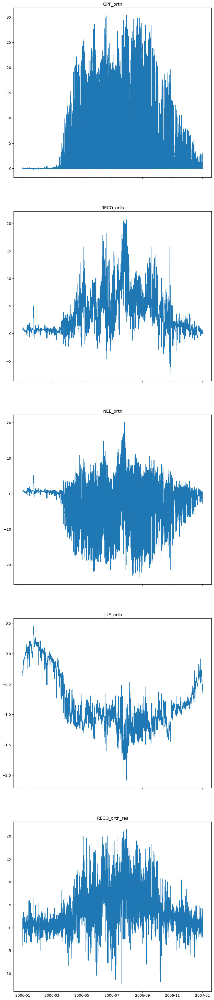

In [95]:
# plot GPP_orth, RECO_orth, NEE_orth, LUE_orth and RECO_orth_res vs. time for the year 2006

fig, axes = plt.subplots(5, 1, figsize = (10, 50), sharex=True)
axes[0].plot(exp.data.loc[indices, 'GPP_orth'])
axes[0].set_title('GPP_orth')
axes[1].plot(exp.data.loc[indices, 'RECO_orth'])
axes[1].set_title('RECO_orth')
axes[2].plot(exp.data.loc[indices, 'NEE_orth'])
axes[2].set_title('NEE_orth')
axes[3].plot(exp.data.loc[indices, 'LUE_orth'])
axes[3].set_title('LUE_orth')
axes[4].plot(exp.data.loc[indices, 'RECO_orth_res'])
axes[4].set_title('RECO_orth_res')
